<table>
<tr>    
<td style="text-align: center">
<h1>Visualization and Inspection of Filters and Representation of Features in ConvNets</h1>
<h2><a href="http://home.agh.edu.pl/~horzyk/index.php">Adrian Horzyk</a></h2>
</td> 
<td>
<img src="http://home.agh.edu.pl/~horzyk/im/AdrianHorzyk49BT140h.png" alt="Adrian Horzyk, Professor" title="Adrian Horzyk, Professor" />        
</td> 
</tr>
</table>
<h3><i>Welcome to the interactive lecture and exercises where you can check everything by yourself and experiment!</i></h3>

# Visualizing what convnets learn

It is often said that deep learning models are "black boxes", learning representations that are difficult to extract and present in a human-readable form. While this is partially true for certain types of deep learning models, it is definitely not true for convnets. The representations learned by convnets are highly amenable to visualization, in large part because they are _representations of visual concepts_. Since 2013, a wide array of techniques have been developed for visualizing and interpreting these representations. The visualized representations of training data (filters) help us to find some adaptation and generalization problems, so it is essential to use visualization to inspect the trained models to find the possible ways for improvement. We won't survey all of them, but we will cover three of the most accessible and useful ones:

<ol>
    <li><b>Visualizing intermediate convnet outputs ("intermediate activations").</b> This is useful to understand how successive convnet layers transform their input, and to get a first idea of the meaning of individual convnet filters.</li>
    <li><b>Visualizing convnets filters.</b> This is useful to understand precisely what visual pattern or concept each filter in a convnet is receptive to.</li>
    <li><b>Visualizing heatmaps of class activation in an image.</b> This is useful to understand which part of an image where identified as belonging to a given class, and thus allows to localize objects in images.</li>
</ol>

To demonstrate them, we will use the cat vs. dog classification problem with the convnets trained from scratch or using VGG-16 network.

In [1]:
import tensorflow as tf
import keras

print ("TensorFlow version: " + tf.__version__)
print ("Keras version: " + keras.__version__)

TensorFlow version: 2.8.0
Keras version: 2.8.0


## 1. Visualizing intermediate activations

Visualizing intermediate activations consists in displaying the feature maps that are output by various convolution and pooling layers in a network for given a certain input. The output of a layer is often called its <b>activation</b>, i.e., the output of the activation function. This gives a view into how an input is decomposed unto the different filters learned by the network. These feature maps we want to visualize have 3 dimensions: width, height, and depth (channels). Each channel encodes relatively independent features, so the proper way to visualize these feature maps is by independently plotting the contents of every channel, as a 2D image.

Visualization of outputs allows for the detection of <b>"dead" cells (neurons)</b>, which do not take part in the classification and training process, because they rarely or never win in competition with the other filters in MaxPooling layers. It may seem like <b>Alzheimer's or Parkinson's disease of the CNN structure</b>. It is very essential from a discrimination and efficiency point of view because dead cells limit them a lot while raising energy consumption, doing nothing useful! If we see the zero reaction on the output of the filter, we can check the filter whether it represents a pattern or white noise generated by the pseudorandom numbers during the weight initialization. This means that the filter has not been modified since the beginning of the training process, and such a filter is unuseful ("dead").

Let's start by loading model 2 that we saved previously. You can use the model stored by me or change the path and use the model from your experiment:

In [ ]:
"""
import os

# When using Google drive
from google.colab import drive
drive.mount('/content/drive')

root_dir = '/content/drive/MyDrive/Notebooks/...'
train_dir = os.path.join(root_dir, 'TrainData')
test_dir = os.path.join(root_dir, 'TestData')
"""

In [2]:
from keras.models import load_model

# The directory where we will store our smaller dataset
base_dir = 'C:/ml/data/kaggle/processed/cats_and_dogs_small'

# The directory where we will store our models
# It can be downloaded from 'https://home.agh.edu.pl/~horzyk/ml/models/'
models_dir = 'C:/ml/models/'

model = load_model(models_dir + 'cats_and_dogs_small_2.h5')

model.summary()  # Show a reminder of this model.

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 17, 17, 128)     

This will be the input image we will use -- a picture of a cat, not part of images that the network was trained on:

In [3]:
import numpy as np

# It can be downloaded from 'https://home.agh.edu.pl/~horzyk/ml/data/kaggle/processed/cats_and_dogs_small/test/cats/cat.1700.jpg'
img_path = base_dir + '/test/cats/cat.1700.jpg'

# We preprocess the image into a 4D tensor
from keras.preprocessing import image

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# Remember that the model was trained on inputs that were preprocessed in the following way, so we must do the same now:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

(1, 150, 150, 3)


How does our loaded image look like?

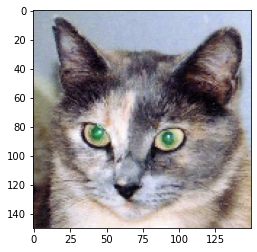

In [4]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

In order to extract the feature maps, we will create a Keras model that takes batches of images as input, and outputs 
the activations of all convolutional and pooling layers. To do this, we will use the Keras class `Model` that is instantiated using two arguments: an input tensor (or a list of input tensors), and an output tensor (or a list of output tensors). The resulting class is a Keras model, just like the `Sequential` models, mapping the specified inputs to the specified outputs. What sets the `Model` class apart is that it allows for models with __multiple outputs__, unlike `Sequential`.

In [5]:
from keras import models

# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model.layers[:8]]

# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

When fed an image input, this model returns the values of the layer activations (outputs of layers) in the original model. This might be the first time you encounter <b>a multi-output model</b>. Until now the models we worked with only had exactly one input and one output. In the general case, a model could have any number of inputs and outputs. This one has one input and 8 outputs, one output per layer activation.

In [6]:
# This will return a list of 5 Numpy arrays:
# one array per layer activation
activations = activation_model.predict(img_tensor)

For instance, this is the activation of the first convolution layer for our cat image input:

In [7]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


It's a 148x148 feature map with 32 channels. Let's try visualizing five sample channels:

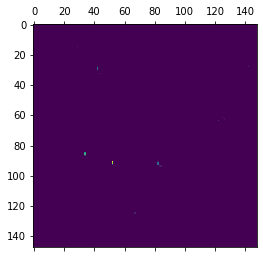

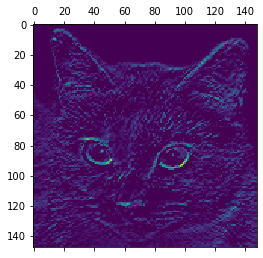

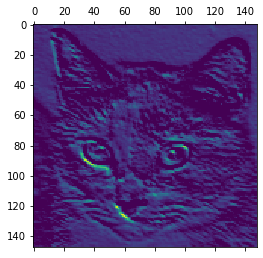

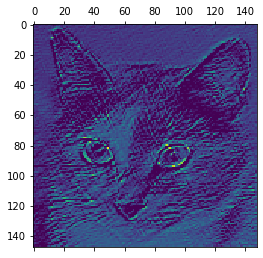

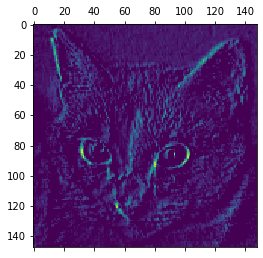

In [8]:
import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, :, :, 0], cmap='viridis')
plt.show()
plt.matshow(first_layer_activation[0, :, :, 3], cmap='viridis')
plt.show()
plt.matshow(first_layer_activation[0, :, :, 6], cmap='viridis')
plt.show()
plt.matshow(first_layer_activation[0, :, :, 9], cmap='viridis')
plt.show()
plt.matshow(first_layer_activation[0, :, :, 12], cmap='viridis')
plt.show()

As we can see, these channels encode and detect different features (presented as bright points).

Let's plot a complete visualization of all the activations in the network. We'll extract and plot every channel in each of our 8 activation maps, and we will stack the results in one big image tensor, with channels stacked side by side.

C:\Users\AH\AppData\Local\Temp/ipykernel_23292/4044860947.py:27: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()


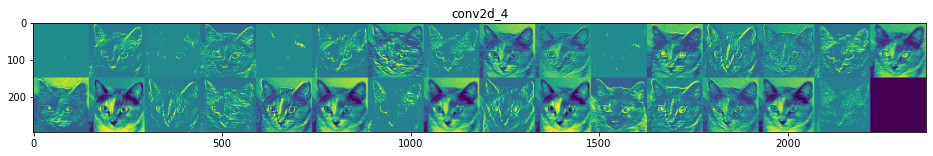

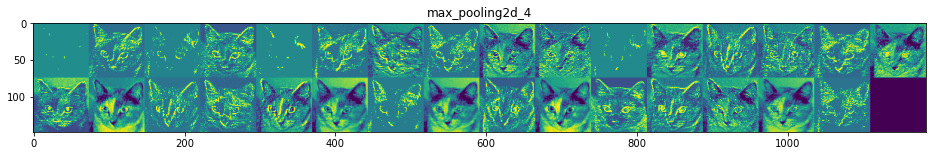

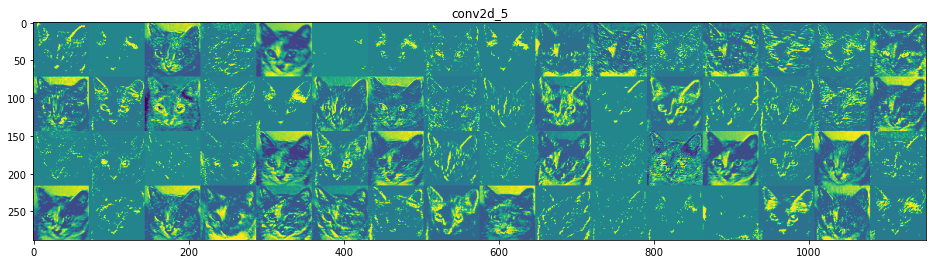

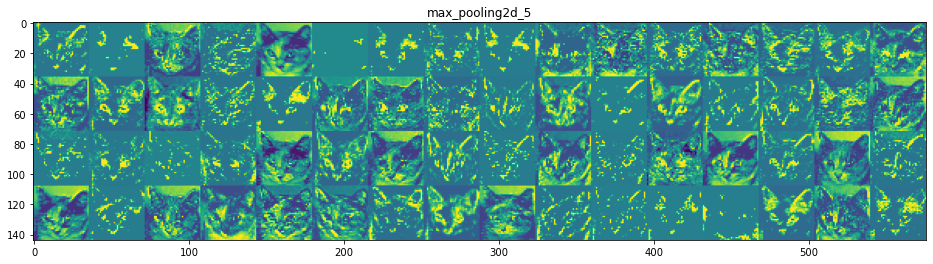

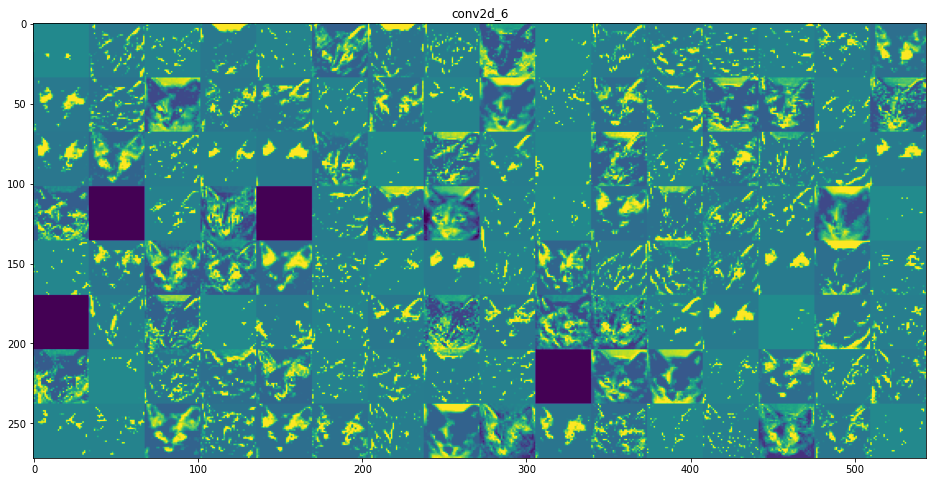

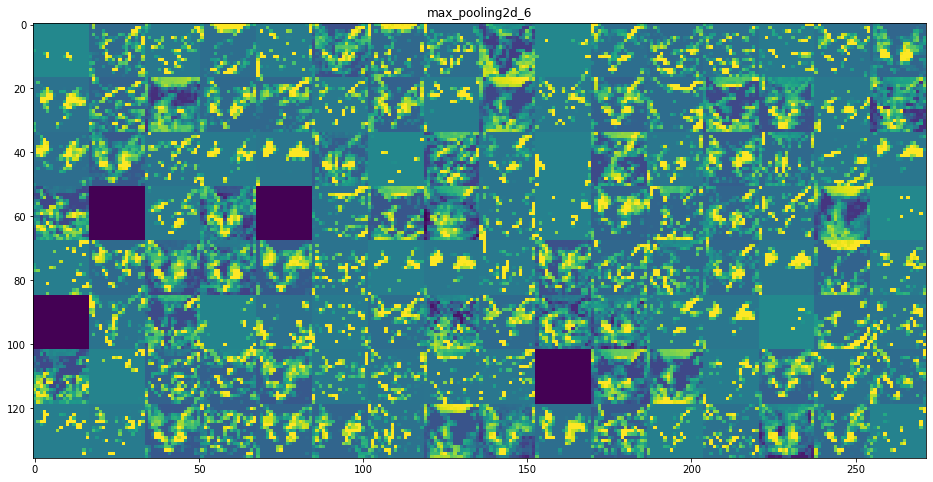

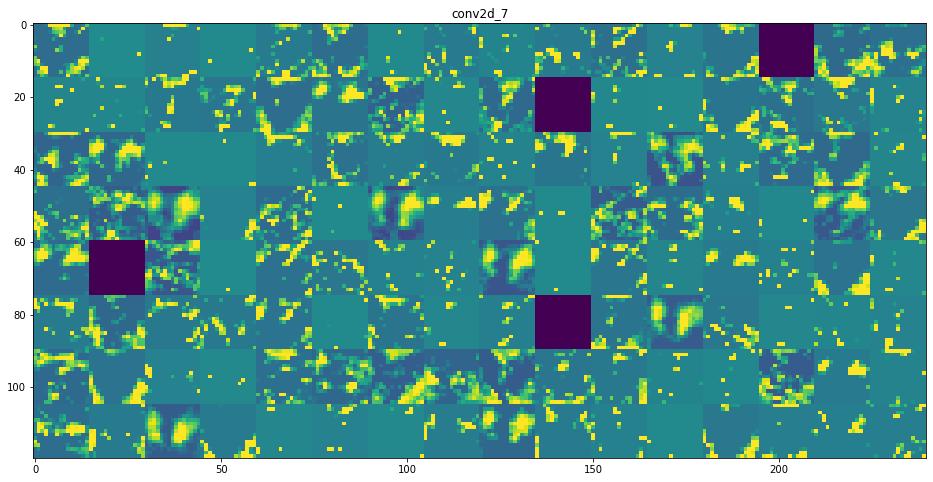

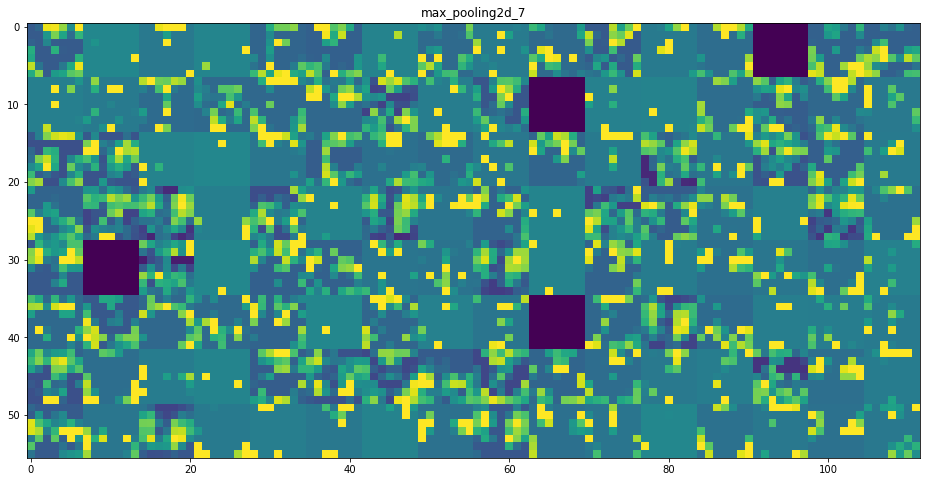

In [9]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features (channels) in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, size * images_per_row))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row]
            
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] 
            = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

### Remarks:

* The first layer acts as a collection of various edge detectors. At that stage, the activations are still retaining almost all of the information present in the initial picture.
* As we go higher-up, the activations become increasingly abstract and less visually interpretable. They start encoding higher-level concepts such as "cat ear" or "cat eye". Higher-up presentations carry increasingly less information about the visual contents of the image, and increasingly more information related to the class of the image.
* The sparsity of the activations is increasing with the depth of the layer: in the first layer, almost all filters are activated by the input image, but in the following layers more and more filters are usually blank (black rectangles). This means that the pattern encoded by the filter isn't found in the input image.
* We can notice that sometimes some filters are very similar to each other; as a result, they code similar features. This might limit the discrimination properties of the network, so maybe the layers should be unfrozen to train better representation and discrimination of the dataset features.
* Sometimes the bright pixels are presented outside the body of the cat. It means that the classification of the cats is processed based on the environment features where the cats were usually photographed! Sometimes it might be an advantage, but sometimes it might be a problem, so bear in mind to pay attention to such bright features outside the classified objects.
* The features extracted by a layer get increasingly abstract with the depth of the layer. The activations of layers higher-up carry less and less information about the specific input (the image), and more and more information about the target (the class of the image: cat or dog in our case). A deep neural network effectively acts as an __information distillation pipeline__, with raw data going in (RBG images in our case), and getting repeatedly transformed so that irrelevant information gets filtered out (e.g. the specific visual appearance of the image) while useful information get magnified and refined (e.g. the class specifics of the image).

The presented process is analogous to the way humans and animals perceive the world: after observing a scene for a few seconds, a human can remember which abstract objects were present in it (e.g. bicycle, tree) but could not retain the specific appearance of these objects. In fact, if you would try to draw a generic bicycle from your mind right now, chances are you could not get it even remotely right, even though you have seen thousands of bicycles in your lifetime. Try it right now: this effect is absolutely real. Your brain has learned to completely abstract its visual input, to transform it into high-level visual concepts while completely filtering out irrelevant visual details, making it tremendously difficult to remember how things around us actually look like.

## 2. Visualizing convnet filters


Another essential thing about how to inspect the filters learned by a convnet is to display the visual pattern that each filter is meant to respond to. This can be done with __gradient ascent in input space__: applying __gradient descent__ to the value of the input image of a convnet so as to maximize the response of a specific filter, starting from a blank input image. The resulting input image would be one that the chosen filter is maximally responsive to.

To do it, we will build a loss function that maximizes the value of a given filter in a given convolution layer; then we will use stochastic gradient descent to adjust the values of the input image so as to maximize this activation value.

For instance, here's a loss for the activation of filter 0 in the layer "block3_conv1" of the VGG16 network, pre-trained on ImageNet:

In [10]:
#from keras.applications import VGG16
from tensorflow.keras.applications import VGG16
#from keras import backend as K
from tensorflow.keras import backend as K
tf.compat.v1.disable_eager_execution()

model = VGG16(weights='imagenet', include_top=False)

layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:, :, :, filter_index])

To implement gradient descent, we will need the gradient of this loss with respect to the input of this model. To do this, we will use the `gradients` function packaged with the `backend` module of Keras:

In [11]:
# The call to `gradients` returns a list of tensors (of size 1 in this case)
# hence we only keep the first element, which is a tensor.
grads = K.gradients(loss, model.input)[0]
#grads = K.GradientTape(loss, model.input)[0]
# https://github.com/tensorflow/tensorflow/issues/33135

A non-obvious trick to use for the gradient descent process to go smoothly is to normalize the gradient tensor, by dividing it by its L2 norm (the square root of the average of the square of the values in the tensor). This ensures that the magnitude of the updates done to the input image is always within a same range.

In [12]:
# We add 1e-5 before dividing so as to avoid accidentally dividing by 0.
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

Now we need a way to compute the value of the loss tensor and the gradient tensor for a given input image. We can define a Keras backend function to do this: `iterate` is a function that takes a Numpy tensor (as a list of tensors of size 1) and returns a list of two Numpy tensors: the loss value and the gradient value.

In [13]:
iterate = K.function([model.input], [loss, grads])

# Let's test it:
import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

At this point, we can define a Python loop to do stochastic gradient descent:

In [14]:
# We start from a gray image with some noise
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.

# Run gradient ascent for 40 steps
step = 1.  # this is the magnitude of each gradient update
for i in range(40):
    # Compute the loss value and gradient value
    loss_value, grads_value = iterate([input_img_data])
    # Here we adjust the input image in the direction that maximizes the loss
    input_img_data += grads_value * step

The resulting image tensor will be a floating point tensor of shape `(1, 150, 150, 3)`, with values that may not be integer within `[0, 255]`. Hence we would need to post-process this tensor to turn it into a displayable image. We do it with the following function:

In [15]:
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

Now we have all the pieces! Let's put them together into a Python function that takes as input a layer name and a filter index, and that returns a valid image tensor representing the pattern that maximizes the activation the specified filter:

In [16]:
def generate_pattern(layer_name, filter_index, size=150):
    # Build a loss function that maximizes the activation of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture with this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])
    
    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

Let's try this function for a few filters:

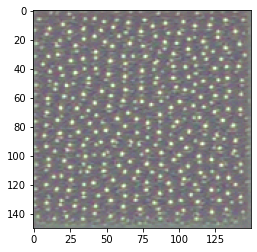

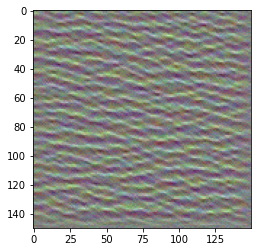

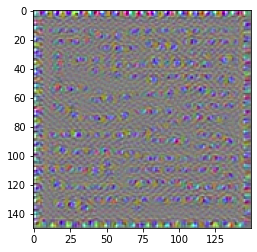

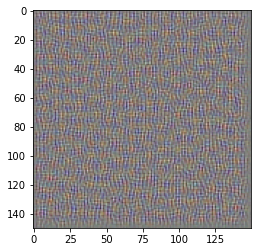

In [17]:
for i in range(4):
    plt.imshow(generate_pattern('block3_conv1', i))
    plt.show()

It seems that filter 0 in layer `block3_conv1` is responsive to a polka dot pattern.

Now, let's visualize all filters in every layer. For simplicity, we will only look at the first 64 filters in each layer, and will only look at the first layer of each convolution block (block1_conv1, block2_conv1, block3_conv1, block4_conv1, 
block5_conv1). We will arrange the outputs on a 8x8 grid of 64x64 filter patterns, with some black margins between each filter pattern.

Layer name: block1_conv1


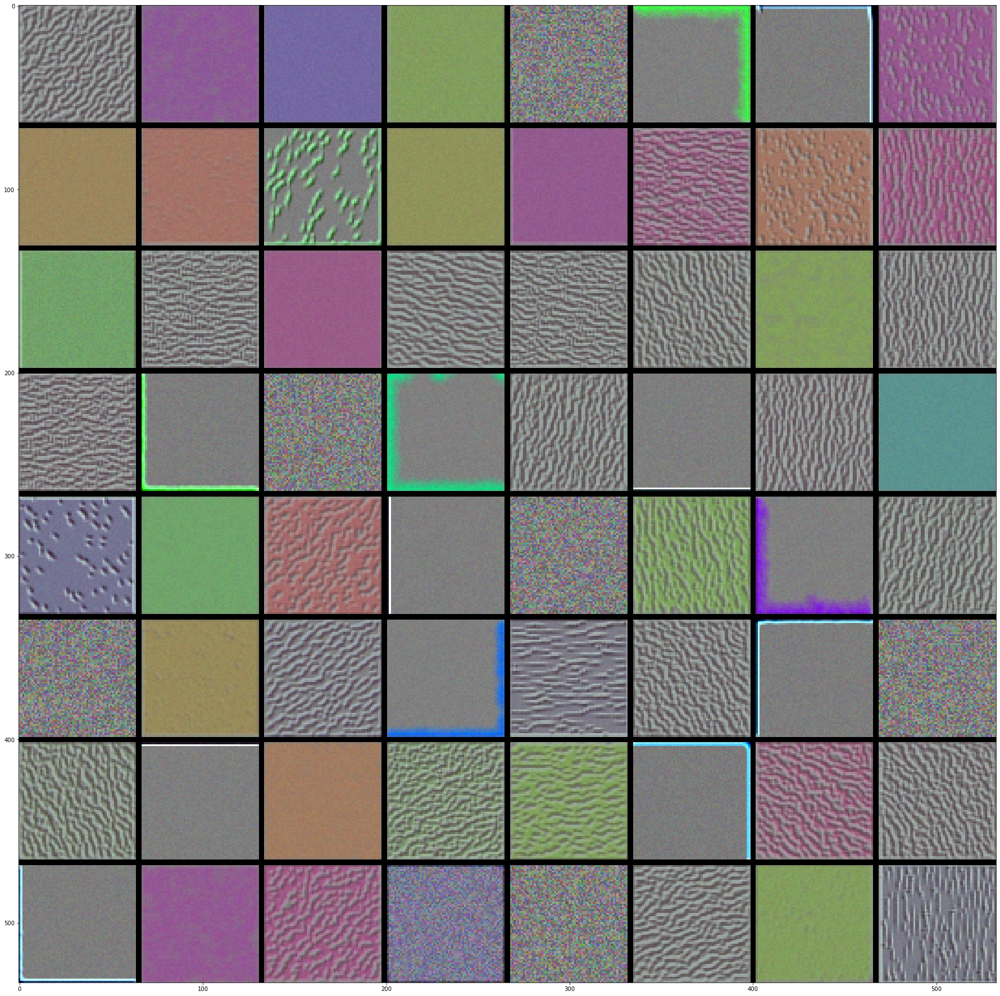

Layer name: block1_conv2


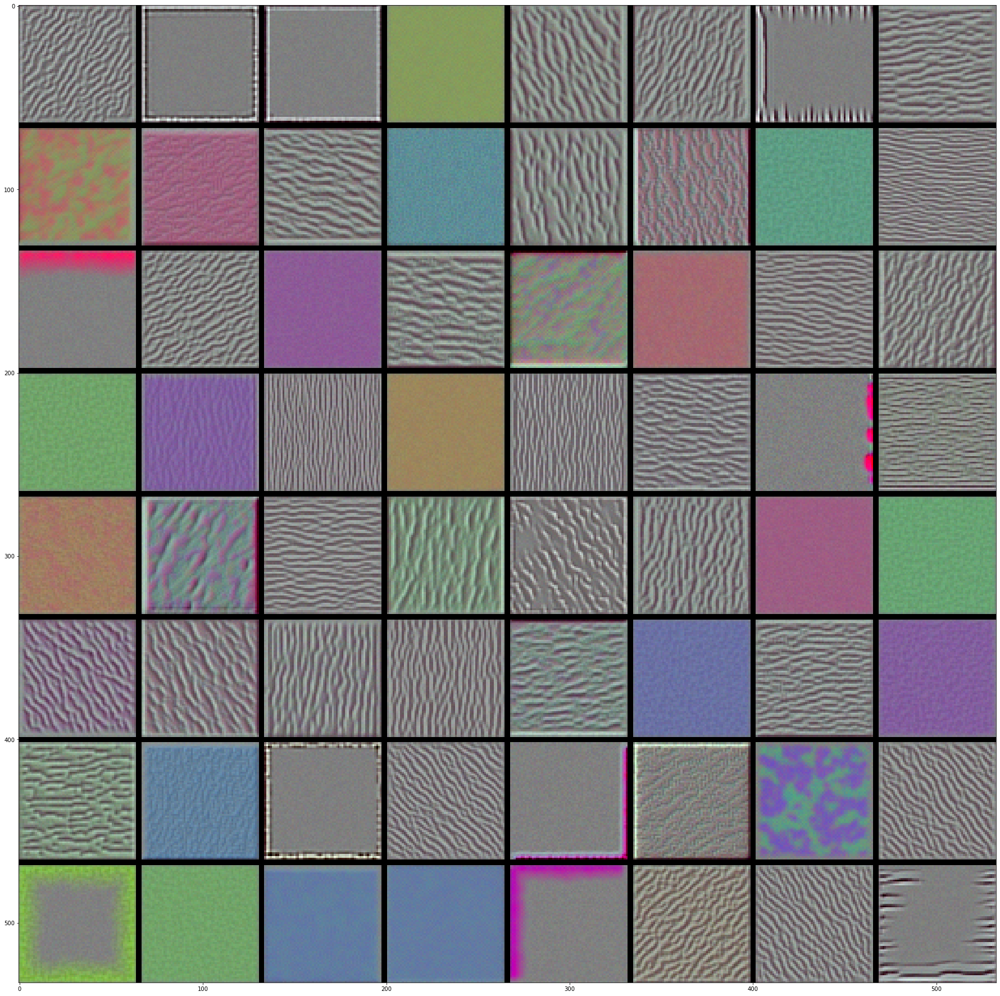

Layer name: block2_conv1


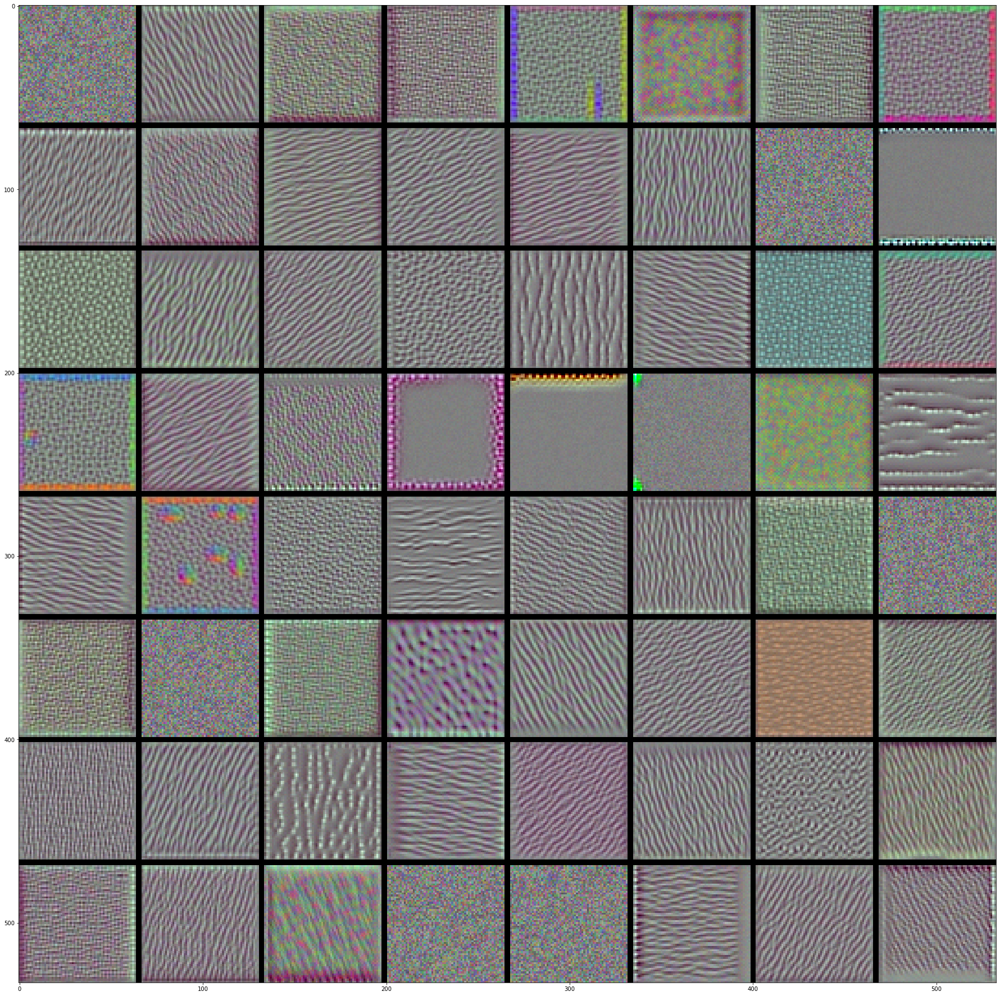

Layer name: block2_conv2


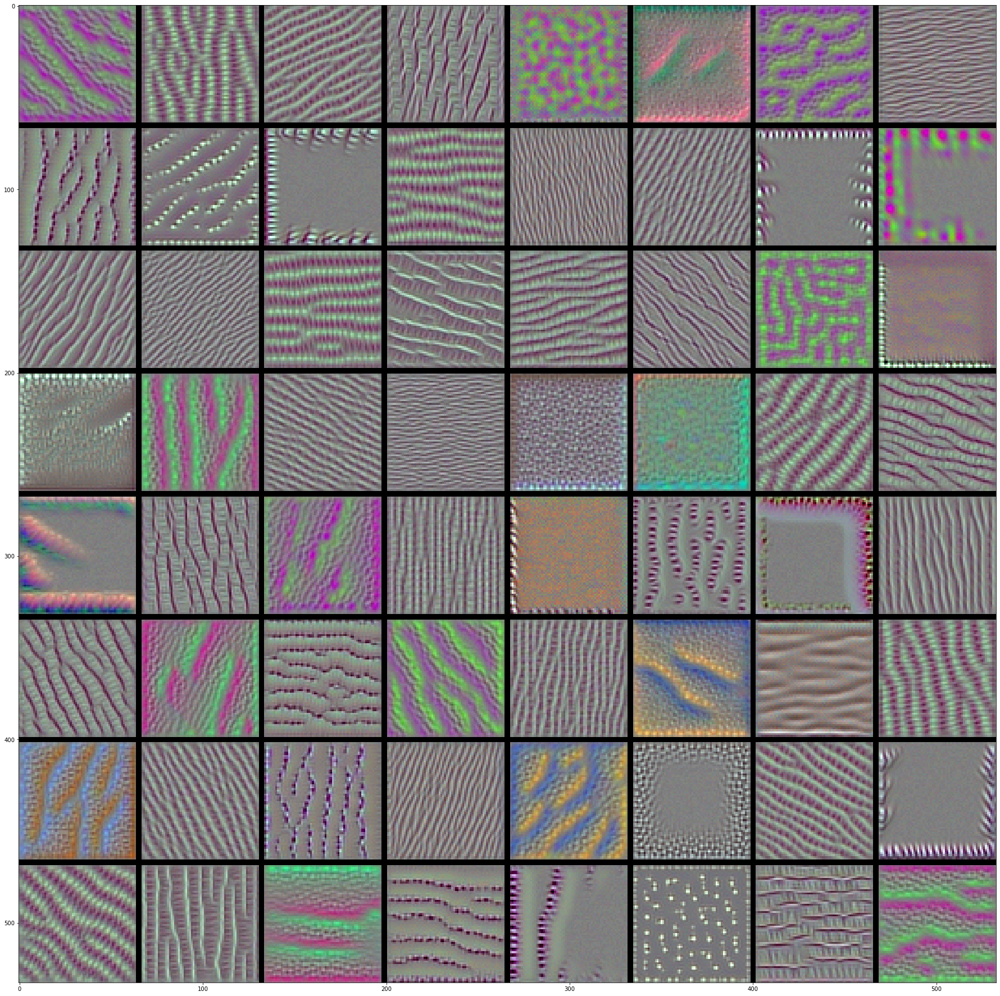

Layer name: block3_conv1


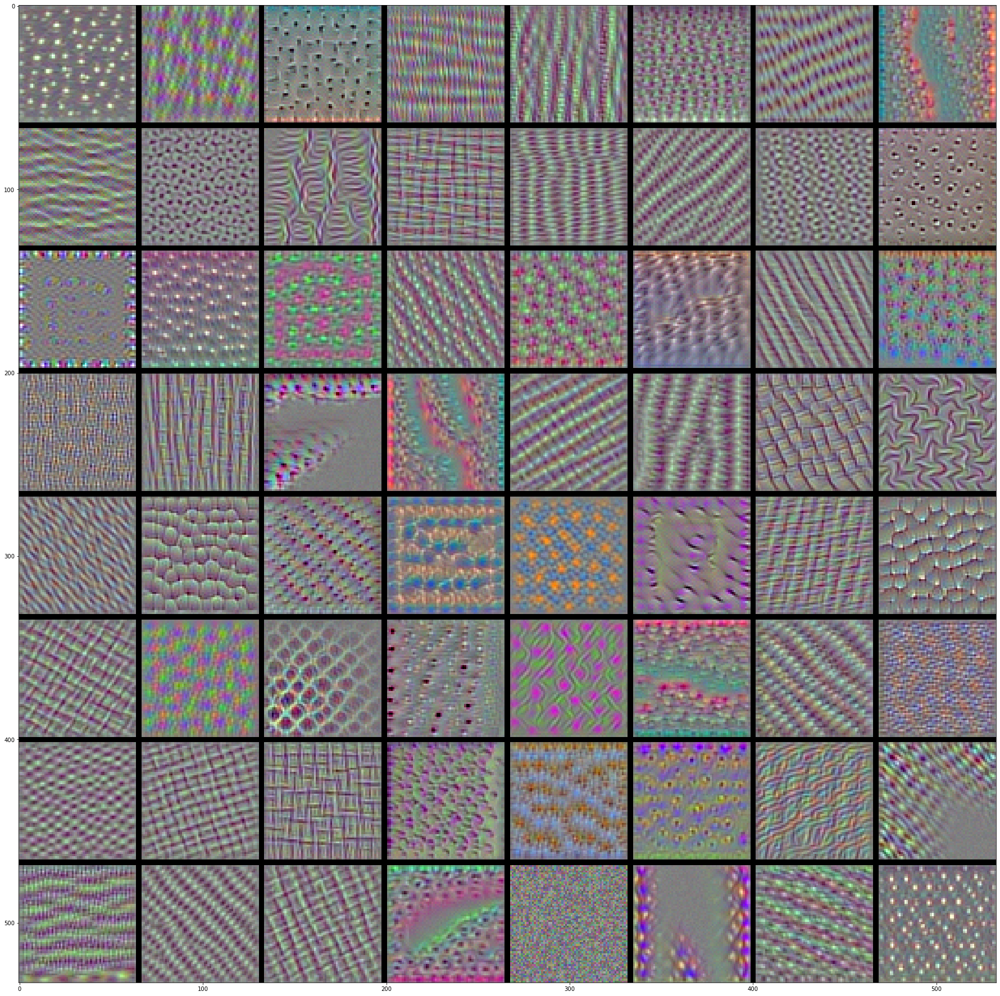

Layer name: block3_conv2


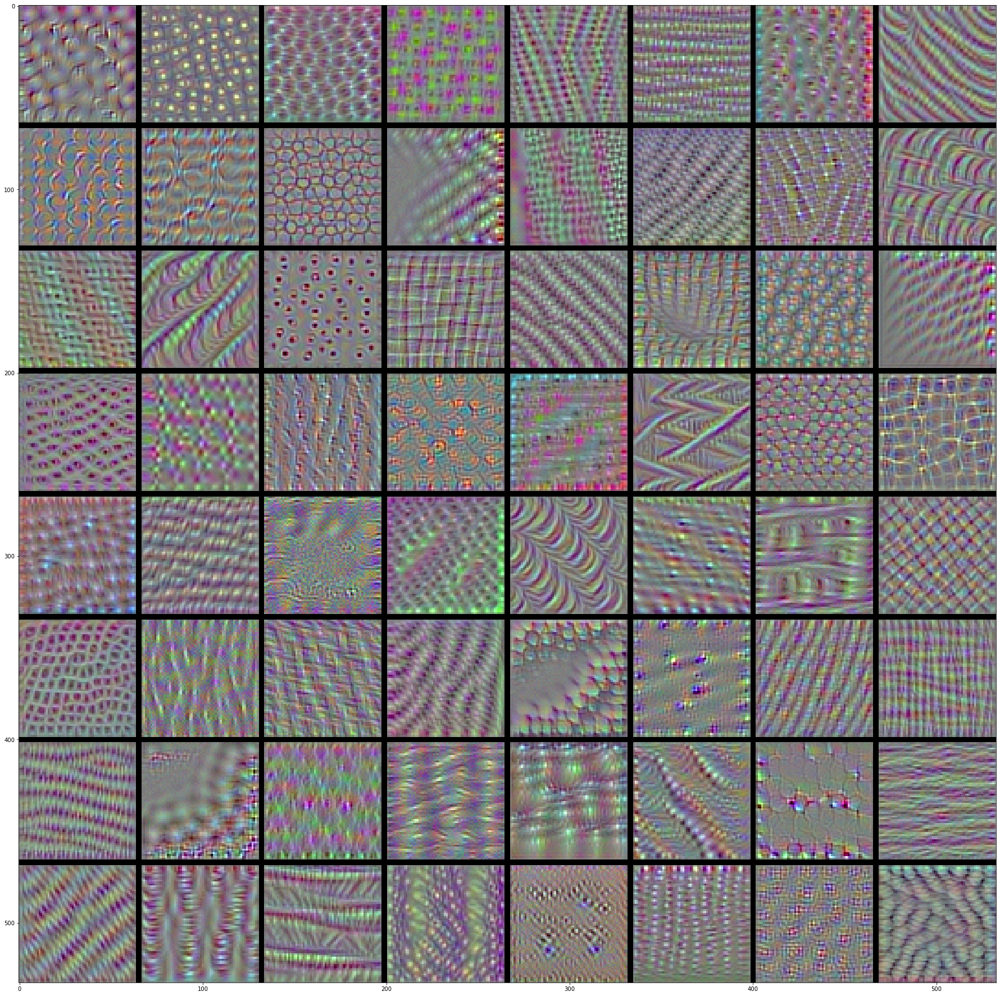

Layer name: block4_conv1


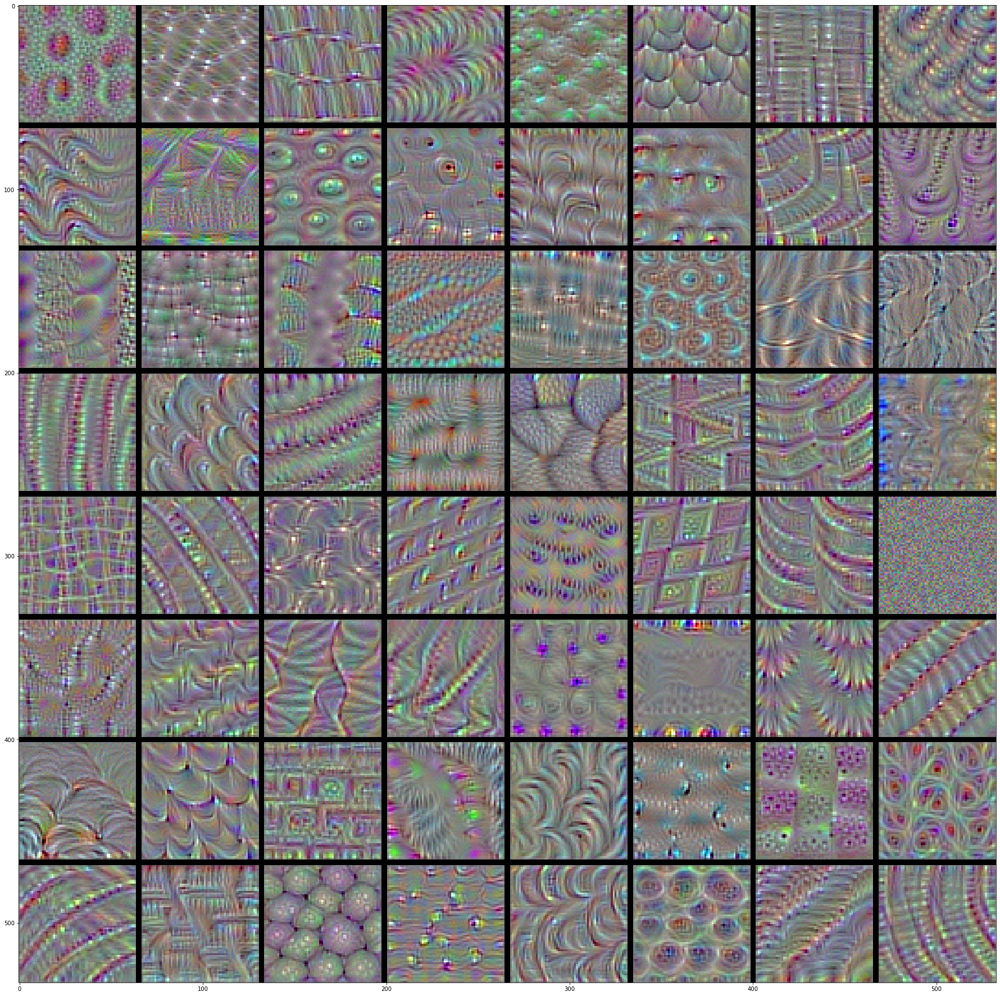

Layer name: block4_conv2


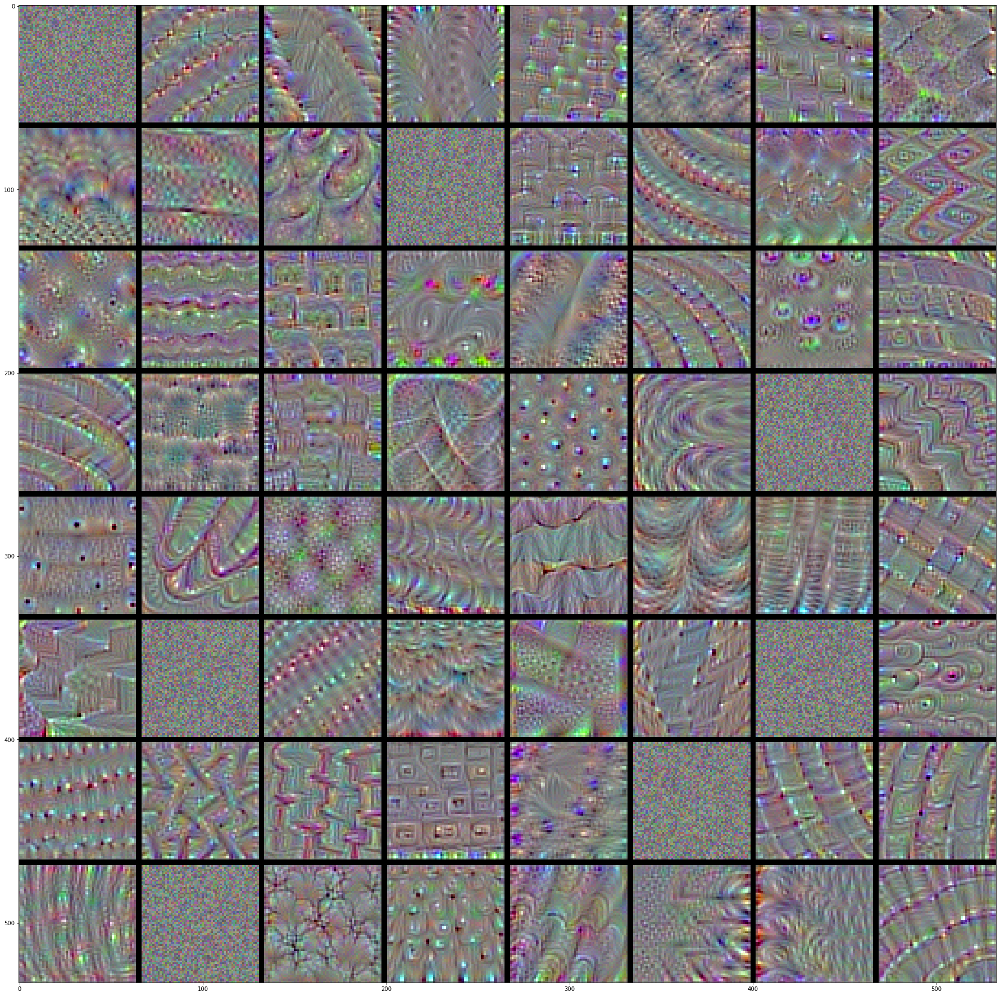

Layer name: block5_conv1


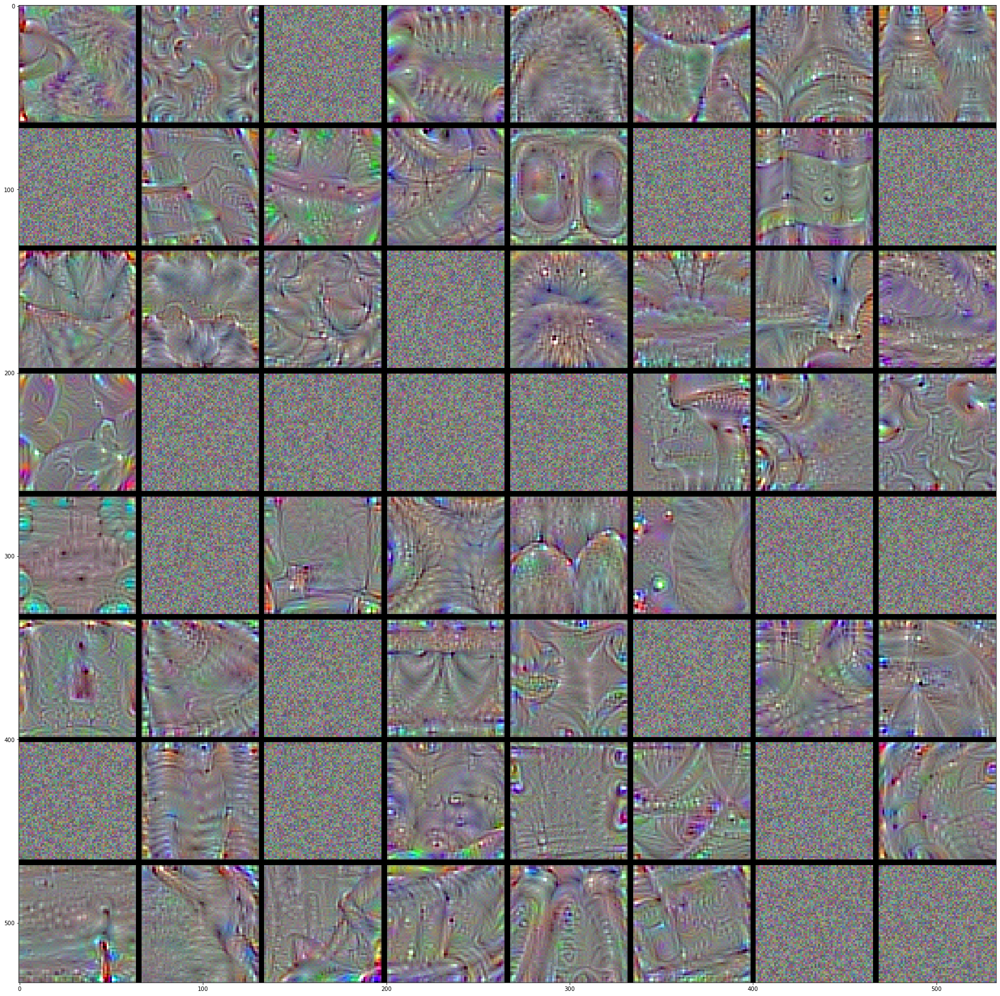

Layer name: block5_conv2


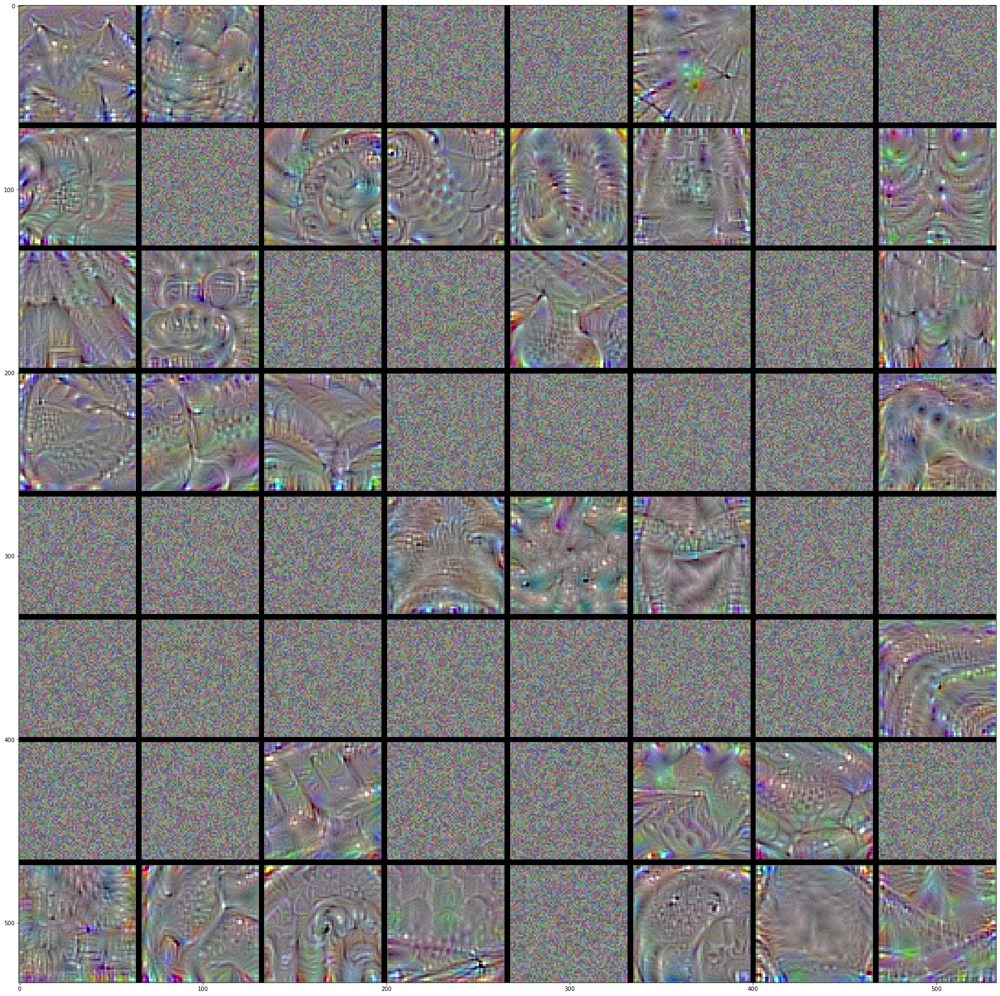

In [18]:
size = 64
margin = 3
no = 8

for layer_name in ['block1_conv1', 'block1_conv2', 'block2_conv1', 'block2_conv2', 'block3_conv1', 'block3_conv2', 'block4_conv1', 'block4_conv2', 'block5_conv1', 'block5_conv2']: 
    
    # This a empty (black) image where we will store our results.
    results = np.zeros((no * size + 7 * margin, no * size + 7 * margin, 3), dtype=np.uint8)

    for i in range(no):  # iterate over the rows of our results grid
        for j in range(no):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * no)` in `layer_name`
            filter_img = generate_pattern(layer_name, i + (j * no), size=size)
            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start : horizontal_end, vertical_start : vertical_end, : ] = filter_img

    # Display the results grid
    print("Layer name: " + layer_name)
    plt.figure(figsize=(size / 2, size / 2))
    plt.imshow(results)
    plt.show()

These filter visualizations tell us a lot about how convnet layers see the world: each layer in a convnet simply learns a collection of filters such that their inputs can be expressed as a combination of the filters. This is similar to how the Fourier transform decomposes signals onto a bank of cosine functions. The filters in these convnet filter banks get increasingly complex and refined as we go higher-up in the model:

* The filters from the first layer in the model (`block1_conv1`) encode simple directional edges and colors (or colored edges in some cases).
* The filters from `block2_conv1` encode simple textures made from combinations of edges and colors.
* The filters in higher-up layers start resembling textures found in natural images: feathers, eyes, leaves, etc.

## 3. Visualizing heatmaps of class activation

We will introduce a visualization technique that is useful for understanding which parts of a given image led a convnet to its final classification decision. This is helpful for "debugging" the decision process of a convnet, in particular in case of classification mistakes. It also allows you to locate specific objects in an image.

This general category of techniques is called __Class Activation Map" (CAM)__ visualization, and consists in producing heatmaps of "class activation" over input images. A "class activation" heatmap is a 2D grid of scores associated with an specific output class, computed for every location in any input image, indicating how important each location is with respect to the class considered. For instance, given a image fed into one of our "cat vs. dog" convnet, Class Activation Map visualization allows us to generate a heatmap for the class "cat", indicating how cat-like different parts of the image are, and likewise for the class "dog", indicating how dog-like differents parts of the image are.

The specific implementation we will use is the one described in [Grad-CAM: Why did you say that? Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/abs/1610.02391). It is very simple: it consists in taking the output feature map of a convolution layer given an input image, and weighing every channel in that feature map by the gradient of the class with respect to the channel. Intuitively, one way to understand this trick is that we are weighting a spatial map of "how intensely the input image activates different channels" by "how important each channel is with regard to the class", resulting in a spatial map of "how intensely the input image activates the class".

We will demonstrate this technique using the pre-trained (original) VGG16 network again:

In [19]:
from keras.applications.vgg16 import VGG16

K.clear_session()

# Note that we are including the densely-connected classifier on top; all previous times, we were discarding it.
model = VGG16(weights='imagenet')

Let's consider the following image of two African elephants, possible a mother and its cub, strolling in the savanna (under a Creative 
Commons license):

![elephants](https://home.agh.edu.pl/~horzyk/ml/data/images/creative_commons_elephant.jpg)

Let's convert this image into something the VGG16 model can read: the model was trained on images of size 224x244, preprocessed according 
to a few rules that are packaged in the utility function `keras.applications.vgg16.preprocess_input`. So we need to load the image, resize 
it to 224x224, convert it to a Numpy float32 tensor, and apply these pre-processing rules.

In [20]:
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

#base_dir_elephant = 'https://home.agh.edu.pl/~horzyk/ml/data/images/creative_commons_elephant.jpg'
base_dir_elephant = 'C:/ml/data/'

# The local path to our target image
img_path = base_dir_elephant + 'creative_commons_elephant.jpg'

# `img` is a PIL image of size 224x224
img = image.load_img(img_path, target_size=(224, 224))

# `x` is a float32 Numpy array of shape (224, 224, 3)
x = image.img_to_array(img)

# We add a dimension to transform our array into a "batch" of size (1, 224, 224, 3)
x = np.expand_dims(x, axis=0)

# Finally we preprocess the batch (this does channel-wise color normalization)
x = preprocess_input(x)

In [21]:
preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

C:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training_v1.py:2079: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


49152/35363 [=========================================] - 0s 1us/step
Predicted: [('n02504458', 'African_elephant', 0.90942115), ('n01871265', 'tusker', 0.08618289), ('n02504013', 'Indian_elephant', 0.004354583)]



The top-3 classes predicted for this image are:

* African elephant (with 92.5% probability)
* Tusker (with 7% probability)
* Indian elephant (with 0.4% probability)

Thus our network has recognized our image as containing an undetermined quantity of African elephants. The entry in the prediction vector 
that was maximally activated is the one corresponding to the "African elephant" class, at index 386:

In [22]:
np.argmax(preds[0])

386

To visualize which parts of this image were the most "African elephant"-like, let's set up the Grad-CAM process:

In [23]:
# This is the "african elephant" entry in the prediction vector
african_elephant_output = model.output[:, 386]

# The is the output feature map of the `block5_conv3` layer,
# the last convolutional layer in VGG16
last_conv_layer = model.get_layer('block5_conv3')

# This is the gradient of the "african elephant" class with regard to
# the output feature map of `block5_conv3`
grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]

# This is a vector of shape (512,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of `block5_conv3`,
# given a sample image
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of two elephants
pooled_grads_value, conv_layer_output_value = iterate([x])

# We multiply each channel in the feature map array
# by "how important this channel is" with regard to the elephant class
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)

For visualization purpose, we will also normalize the heatmap between 0 and 1:

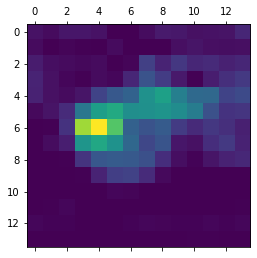

In [24]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

Finally, we will use OpenCV to generate an image that superimposes the original image with the heatmap we just obtained:

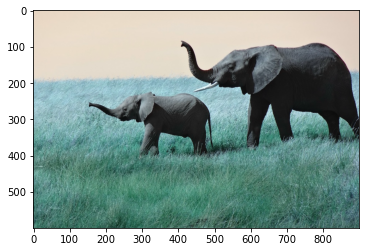

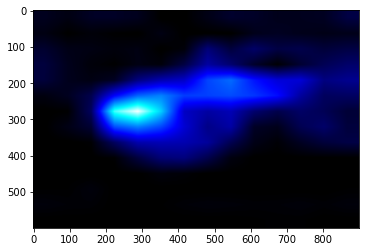

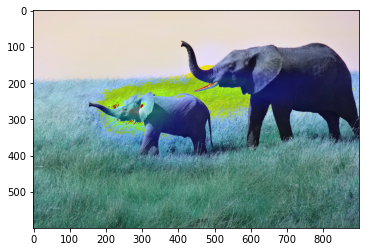

C:/ml/data/elephant_cam.jpg


In [27]:
# pip install opencv-python
# Install opencv before running this cell
import cv2

# We use cv2 to load the original image
img = cv2.imread(img_path)
plt.imshow(img)
plt.show()

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_HOT)
plt.imshow(heatmap)
plt.show()

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.3 + img
superimposed_img = superimposed_img.astype('uint8')

plt.imshow(superimposed_img)
plt.show()

# Save the image to disk
cv2.imwrite(base_dir_elephant + 'elephant_cam.jpg', superimposed_img)

print(base_dir_elephant + 'elephant_cam.jpg')

![elephant cam](https://home.agh.edu.pl/~horzyk/ml/data/images/elephant_cam.jpg)

This visualisation technique answers two important questions:

* Why did the network think this image contained an African elephant?
* Where is the African elephant located in the image?

In particular, it is interesting to note that the ears of the elephant cub are strongly activated: this is probably how the network can recognize the difference between African and Indian elephants.


## Assignments

* Try to visualize intermediate activations for a different image from this dataset (e.g. for a dog) and compare the visualized intermediate activation results.
* Try tu use the `generate_pattern` function for different filter indices.
* Use a different dataset from <a href="www.kaggle.com">Kaggle.com</a> or another source and visualize:
<ol>
    <li>intermediate activations,</li>
    <li>convnets filters,</li>
    <li>heatmaps of class activation in an image.</li>
</ol>
